# Demand-Forecasting-Retail

## Part 1 - EDA and Data Pre-Processing


### Contents
[Part 1 - Project Overview](#overview)  
[Part 2 - Initial Setup](#setup)  
[Part 3 - Exploratory Data Analysis](#eda)  
[Part 4 - Data Pre-Processing and Transformation](#pre-processing)  
[Part 5 - References](#references) 

___
<a name="overview"></a>
## (1) Project Overview

**The Challenge**

The goal is to develop a demand forecasting model for Walmart, a large grocery store chain, to optimize inventory management and reduce costs.

Link: https://www.kaggle.com/datasets/aslanahmedov/walmart-sales-forecast

### Data              
1. **Store:** Store ID (a unique identifier for each store)
2. **DayOfWeek:** The day of the week (Monday = 1)
3. **Date:** The date (YYYY-MM-DD)
4. **Sales:** The amount of sales for a given day.
5. **Customers:** The number of customers who bought something during a given day.
6. **Open:** A binary variable indicating whether the store was open: 0 = closed, 1 = open.
7. **Promo:** A binary variable indicating whether a store was promoting: 0 = not promo, 1 = promo.
8. **StateHoliday:** A binary variable indicating whether a store was closed due to a state holiday: 0 = no, 1 = yes
9. **SchoolHoliday:** A binary variable indicating whether a store was closed due to a school holiday: 0 = not promo, 1 = promo

### Dataset Size
1. **Training Set:** 10,000 rows
2. **Test Set:** 2,700 rows

### Data Preparation Steps
1. **Data Cleaning:** Remove any null or missing values in the dataset.
2. **Feature Engineering:** Create new features like day of the week, month, year, week of the year, weekend, holiday, etc.
3. **Data Transformation:** Convert categorical variables into numerical format (if required) using one-hot encoding or label encoding.
4. **Outlier Detection and Handling:** Identify and handle outliers in the dataset.
5. **Feature Scaling:** Normalize or standardize the numerical features to ensure they are on the same scale.

### Data Exploration and Analysis
1. **Univariate Analysis:** Analyze the distribution of each feature and identify any outliers.
2. **Bivariate Analysis:** Examine the relationship between features and sales. Look for any patterns or trends.
3. **Multivariate Analysis:** Analyze the interaction between multiple features and sales. Look for any correlations or interactions.
4. **Time Series Analysis:** Analyze the sales trends over time. Look for seasonality, trends, and any patterns. 


___
<a name="setup"></a>
## (2) Initial Setup

### Import dependencies

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.preprocessing import StandardScaler, LabelEncoder, OrdinalEncoder, MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn import metrics

import opendatasets as od
import zipfile
import os
import shutil
import pickle

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import warnings
warnings.filterwarnings("ignore")

### Download Datasets
To use the Kaggle API, sign up for a Kaggle account at https://www.kaggle.com. Then go to the 'Account' tab of your user profile (https://www.kaggle.com/<username>/account) and select 'Create API Token'. This will trigger the download of kaggle.json, a file containing your API credentials.

In [23]:
import os
import pandas as pd

# Define the source directory containing the CSV files
source_dir = 'C://Users//newth//Downloads//walmart-sales-forecast'

# Define the destination directory for saving the new CSV files
raw_path = './data/raw/'

# Create the destination directory if it doesn't exist
os.makedirs(raw_path, exist_ok=True)

# Loop through all CSV files in the source directory
for file in os.listdir(source_dir):
    if file.endswith('.csv'):
        file_path = os.path.join(source_dir, file)
        # Load the CSV file into a DataFrame
        df = pd.read_csv(file_path)
        # Optionally, inspect the first few rows of the DataFrame
        print(f'Loaded {file}:')
        print(df.head())
        # Save the DataFrame to the new location
        df.to_csv(os.path.join(raw_path, file), index=False)
        print(f'Dataset saved to: {os.path.join(raw_path, file)}')

Loaded features.csv:
   Store        Date  Temperature  Fuel_Price  MarkDown1  MarkDown2  \
0      1  2010-02-05        42.31       2.572        NaN        NaN   
1      1  2010-02-12        38.51       2.548        NaN        NaN   
2      1  2010-02-19        39.93       2.514        NaN        NaN   
3      1  2010-02-26        46.63       2.561        NaN        NaN   
4      1  2010-03-05        46.50       2.625        NaN        NaN   

   MarkDown3  MarkDown4  MarkDown5         CPI  Unemployment  IsHoliday  
0        NaN        NaN        NaN  211.096358         8.106      False  
1        NaN        NaN        NaN  211.242170         8.106       True  
2        NaN        NaN        NaN  211.289143         8.106      False  
3        NaN        NaN        NaN  211.319643         8.106      False  
4        NaN        NaN        NaN  211.350143         8.106      False  
Dataset saved to: ./data/raw/features.csv
Loaded stores.csv:
   Store Type    Size
0      1    A  151315
1  

In [ ]:
# Unzip and store the CSV files in another folder (input folder) [IF file is zip]
# for filename in os.listdir(raw_path):
#     with zipfile.ZipFile(raw_path+filename, 'r') as zip_ref:
#         zip_ref.extractall('./data/input/')

In [24]:
# Move train and test flat files into input folder
for filename in os.listdir(raw_path):
    if 'train' in filename or 'test' in filename:
        shutil.copy(raw_path+filename, './data/input/'+filename)

### Import Data

In [25]:
# Import input datasets
main_df = pd.read_csv('data/input/train.csv')

# Keep only random 1/3 sample of data (to optimize size for training)
main_df = main_df.sample(frac=0.3, replace=False, random_state=42).reset_index(drop=True)

len(main_df)

126471

In [32]:
print("Columns in DataFrame:", main_df.columns)

Columns in DataFrame: Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday'], dtype='object')


In [33]:
print(main_df.head())

   Store  Dept        Date  Weekly_Sales  IsHoliday
0      1     1  2010-02-05      24924.50      False
1      1     1  2010-02-12      46039.49       True
2      1     1  2010-02-19      41595.55      False
3      1     1  2010-02-26      19403.54      False
4      1     1  2010-03-05      21827.90      False


In [34]:
main_df.columns = main_df.columns.str.strip()  # Remove any leading/trailing spaces

Note: We are not using the test.csv dataset because it does not have the target `Response` variable, and we will not be submitting our predictions to Kaggle

### Setup helper functions

In [36]:
import pandas as pd

# Load the dataset
main_df = pd.read_csv('data/input/train.csv')

# Check the columns
print("Columns in DataFrame:", main_df.columns)

# Check the first few rows
print(main_df.head())

# Strip any leading/trailing spaces from column names
main_df.columns = main_df.columns.str.strip()

# Function to show value counts
def show_value_counts(df, column):
    if column in df.columns:
        value_count_df = pd.DataFrame(df[column].value_counts().rename_axis(column).reset_index(name='counts'))
        value_count_df['percentage'] = round(100 * (value_count_df['counts'] / len(df)), 1)
        return value_count_df
    else:
        print(f"Column '{column}' does not exist in the DataFrame.")
        return None

# Call the function with the 'Response' column
response_counts = show_value_counts(main_df, 'Response')  # Change 'Response' if necessary
if response_counts is not None:
    print("Value Counts for 'Response':")
    print(response_counts)

Columns in DataFrame: Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday'], dtype='object')
   Store  Dept        Date  Weekly_Sales  IsHoliday
0      1     1  2010-02-05      24924.50      False
1      1     1  2010-02-12      46039.49       True
2      1     1  2010-02-19      41595.55      False
3      1     1  2010-02-26      19403.54      False
4      1     1  2010-03-05      21827.90      False
Column 'Response' does not exist in the DataFrame.


In [37]:
import pandas as pd

# Load the dataset
main_df = pd.read_csv('data/input/train.csv')

# Check the columns
print("Columns in DataFrame:", main_df.columns)

# Check the first few rows
print(main_df.head())

# Function to show value counts
def show_value_counts(df, column):
    if column in df.columns:
        value_count_df = pd.DataFrame(df[column].value_counts().rename_axis(column).reset_index(name='counts'))
        value_count_df['percentage'] = round(100 * (value_count_df['counts'] / len(df)), 1)
        return value_count_df
    else:
        print(f"Column '{column}' does not exist in the DataFrame.")
        return None

# Call the function with the 'Weekly_Sales' column
weekly_sales_counts = show_value_counts(main_df, 'Weekly_Sales')  # Change 'Response' to 'Weekly_Sales'
if weekly_sales_counts is not None:
    print("Value Counts for 'Weekly_Sales':")
    print(weekly_sales_counts)

Columns in DataFrame: Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday'], dtype='object')
   Store  Dept        Date  Weekly_Sales  IsHoliday
0      1     1  2010-02-05      24924.50      False
1      1     1  2010-02-12      46039.49       True
2      1     1  2010-02-19      41595.55      False
3      1     1  2010-02-26      19403.54      False
4      1     1  2010-03-05      21827.90      False
Value Counts for 'Weekly_Sales':
        Weekly_Sales  counts  percentage
0              10.00     353         0.1
1               5.00     289         0.1
2              20.00     232         0.1
3              15.00     215         0.1
4              12.00     175         0.0
5               1.00     169         0.0
6              10.47     167         0.0
7              11.97     154         0.0
8               2.00     148         0.0
9               7.00     146         0.0
10              3.00     141         0.0
11             30.00     140         0.0
12             25.00  

Descriptive Statistics for 'Weekly_Sales':
count    421570.000000
mean      15981.258123
std       22711.183519
min       -4988.940000
25%        2079.650000
50%        7612.030000
75%       20205.852500
max      693099.360000
Name: Weekly_Sales, dtype: float64


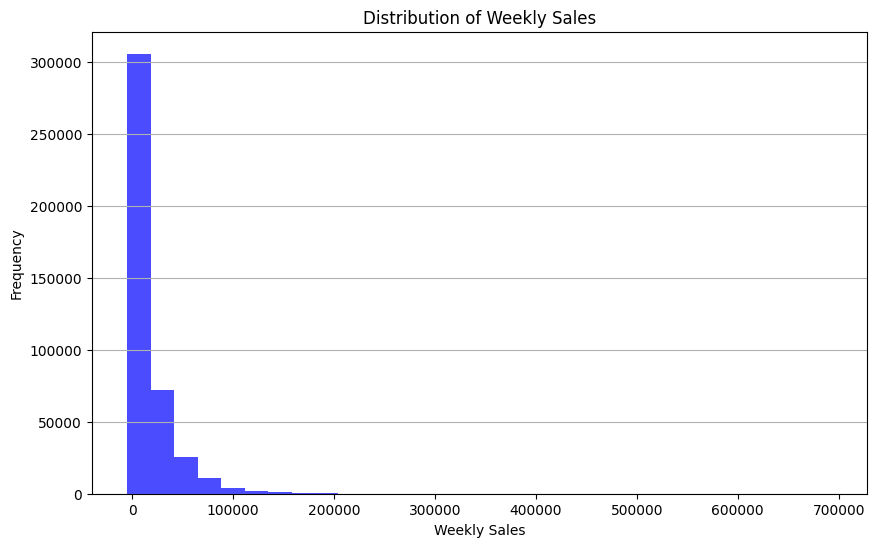

In [38]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
main_df = pd.read_csv('data/input/train.csv')

# Display descriptive statistics for 'Weekly_Sales'
print("Descriptive Statistics for 'Weekly_Sales':")
print(main_df['Weekly_Sales'].describe())

# Plot a histogram of 'Weekly_Sales'
plt.figure(figsize=(10, 6))
plt.hist(main_df['Weekly_Sales'], bins=30, color='blue', alpha=0.7)
plt.title('Distribution of Weekly Sales')
plt.xlabel('Weekly Sales')
plt.ylabel('Frequency')
plt.grid(axis='y')
plt.show()

Value Counts for 'IsHoliday':
   IsHoliday  counts  percentage
0      False  391909        93.0
1       True   29661         7.0

NaN Counts:
              counts  percentage
Store              0         0.0
Dept               0         0.0
Date               0         0.0
Weekly_Sales       0         0.0
IsHoliday          0         0.0


<Figure size 1200x800 with 0 Axes>

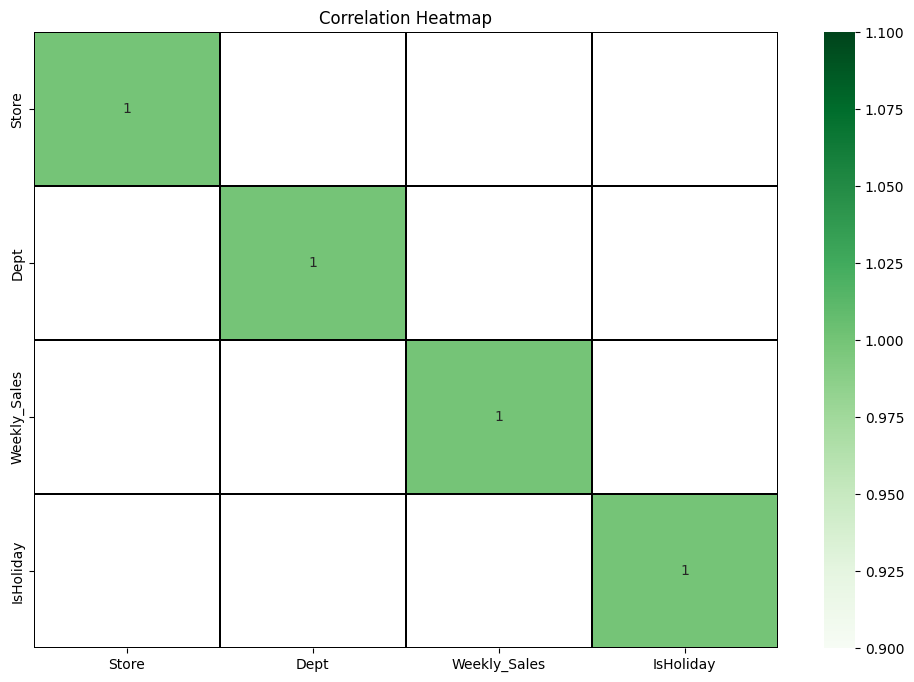

In [40]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Function to display value counts and percentages for a specified column
def show_value_counts(df, column):
    value_count_df = pd.DataFrame(df[column].value_counts().rename_axis(column).reset_index(name='counts'))
    value_count_df['percentage'] = round(100 * (value_count_df['counts'] / len(df)), 1)
    return value_count_df

# Function to display NaN counts and percentages for each column
def show_nan_counts(df):
    nan_count_df = pd.DataFrame(df.isna().sum()).sort_values(by=0, ascending=False)
    nan_count_df.columns = ['counts']
    nan_count_df['percentage'] = round(100 * (nan_count_df['counts'] / len(df)), 1)
    return nan_count_df

# Function to display a correlation heatmap
def show_heatmap(data, figsize=(12, 8), highest_only=False, threshold=0.7, annot=False):
    correlation_matrix = data.corr()
    high_corr = correlation_matrix[np.abs(correlation_matrix) >= threshold]
    plt.figure(figsize=figsize)

    if highest_only:
        sns.heatmap(high_corr, annot=annot, cmap="Greens", linecolor='black', linewidths=0.1)
    else:
        sns.heatmap(correlation_matrix, annot=annot, cmap="coolwarm", linecolor='black', linewidths=0.1)

# Example usage
if __name__ == "__main__":
    # Load the dataset
    main_df = pd.read_csv('data/input/train.csv')

    # Display value counts for a specific column (e.g., 'IsHoliday')
    holiday_counts = show_value_counts(main_df, 'IsHoliday')
    print("Value Counts for 'IsHoliday':")
    print(holiday_counts)

    # Display NaN counts
    nan_counts = show_nan_counts(main_df)
    print("\nNaN Counts:")
    print(nan_counts)

    # Display correlation heatmap
    plt.figure(figsize=(12, 8))
    show_heatmap(main_df, highest_only=True, threshold=0.7, annot=True)
    plt.title('Correlation Heatmap')
    plt.show()

___
<a name="eda"></a>
## (3) Exploratory Data Analysis (EDA)

In [41]:
main_df.shape

(421570, 5)

In [42]:
main_df.sample(10)

,Store,Dept,Date,Weekly_Sales,IsHoliday
200290,21,21,2011-04-22,3296.58,False
384375,41,26,2011-05-20,5170.87,False
247090,26,2,2010-12-24,47535.24,False
285950,29,93,2011-03-04,1138.46,False
178345,19,9,2010-05-14,22388.47,False
216440,22,95,2011-03-11,52865.65,False
142211,15,30,2012-05-25,4009.39,False
52227,6,26,2010-10-15,10053.35,False
245133,25,81,2011-04-29,6332.39,False
95342,10,72,2010-04-23,121366.02,False


___
### Response (target) variable

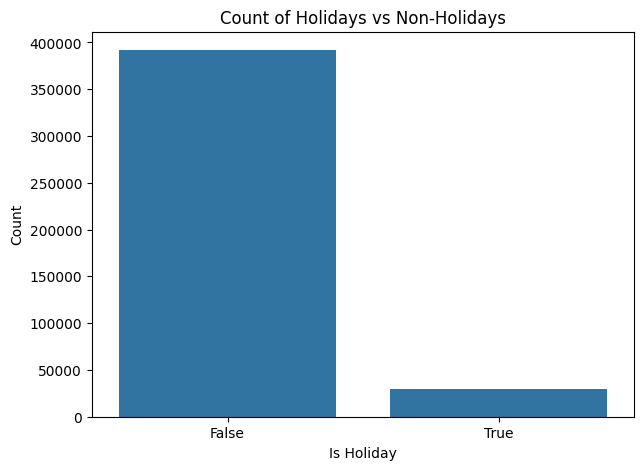

In [45]:
# Create a count plot for the 'IsHoliday' column
fig, ax = plt.subplots(1, 1, figsize=(7, 5))
sns.countplot(x='IsHoliday', data=main_df, order=[False, True], ax=ax)

# Set the title and labels
ax.set_title('Count of Holidays vs Non-Holidays')
ax.set_xlabel('Is Holiday')
ax.set_ylabel('Count')

# Show the plot
plt.show()

### Predictor Variables

In [46]:
main_df.dtypes

Store             int64
Dept              int64
Date             object
Weekly_Sales    float64
IsHoliday          bool
dtype: object

In [47]:
# Identify columns which are not numerical:
categorical = [col for col in main_df.columns if main_df[col].dtype =='object']
categorical

['Date']

In [48]:
show_nan_counts(main_df)

,counts,percentage
Store,0,0.0
Dept,0,0.0
Date,0,0.0
Weekly_Sales,0,0.0
IsHoliday,0,0.0


___
#### Correlation Plot for Basic Columns

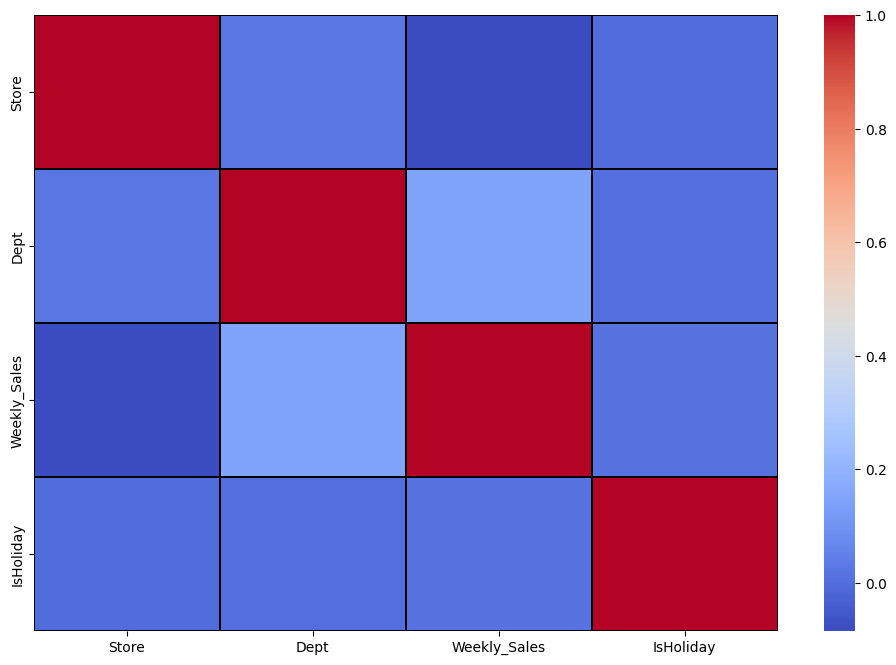

In [49]:
show_heatmap(main_df)

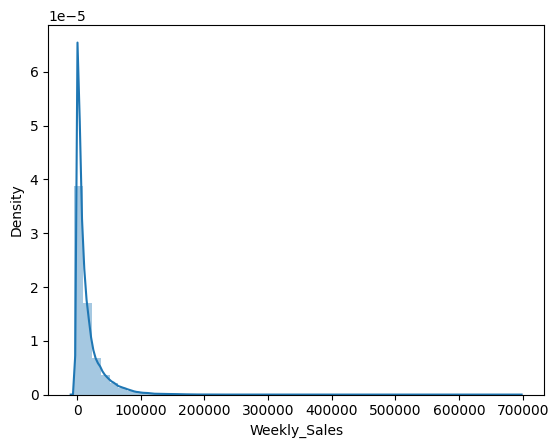

In [52]:
sns.distplot(main_df['Weekly_Sales'])

___
<a name="pre-processing"></a>
## (4) Data Pre-Processing and Transformation

In [53]:
main_df.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2010-02-05,24924.50,False
1,1,1,2010-02-12,46039.49,True
2,1,1,2010-02-19,41595.55,False
3,1,1,2010-02-26,19403.54,False
4,1,1,2010-03-05,21827.90,False


In [56]:
import pandas as pd

def preprocess_data(df):
    # Convert 'Date' to datetime format
    df['Date'] = pd.to_datetime(df['Date'])
    
    # Extract year, month, and day of the week from 'Date'
    df['Year'] = df['Date'].dt.year
    df['Month'] = df['Date'].dt.month
    df['DayOfWeek'] = df['Date'].dt.dayofweek  # Monday=0, Sunday=6
    
    # Encode 'IsHoliday' as a binary variable (0 and 1)
    df['IsHoliday'] = df['IsHoliday'].astype(int)
    
    # Convert 'Store' and 'Dept' to categorical variables
    df['Store'] = df['Store'].astype('category')
    df['Dept'] = df['Dept'].astype('category')
    
    # One hot encoding of categorical variables (with drop first)
    df = pd.get_dummies(df, columns=['Store', 'Dept'], drop_first=True)
    
    # Drop the original 'Date' column if not needed
    df = df.drop('Date', axis=1)
    
    return df

# Example usage
# main_df = pd.read_csv('data/input/train.csv')
# processed_df = preprocess_data(main_df)
# print(processed_df.head())

In [57]:
main_df = preprocess_data(main_df)

### Train Test Split

In [58]:
# Shuffle your dataset 
shuffle_df = main_df.sample(frac=1, random_state=1)

# Define a size for your train set (80:20)
train_size = int(0.8 * len(main_df))

# Split your dataset 
train_df = shuffle_df[:train_size]
test_df = shuffle_df[train_size:]

### Scale Data

In [59]:
import pandas as pd
import pickle
from sklearn.preprocessing import MinMaxScaler

def scale_data(df, train):
    # Define numerical features to scale
    numerical_features = ['Weekly_Sales', 'Year', 'Month', 'DayOfWeek']  # Add any other numerical features if needed
    
    if train:
        mm = MinMaxScaler() 
        df[numerical_features] = mm.fit_transform(df[numerical_features])
        # Save the scaler for future use
        pickle.dump(mm, open("./data/minmax_scaler.pkl", 'wb'))
    else:
        # Load the previously saved scaler
        mm = pickle.load(open("./data/minmax_scaler.pkl", 'rb'))
        df[numerical_features] = mm.transform(df[numerical_features])
        
    return df

# Example usage
# main_df = pd.read_csv('data/input/train.csv')
# processed_df = preprocess_data(main_df)
# scaled_df = scale_data(processed_df, train=True)  # Set train=False for validation/test data
# print(scaled_df.head())

In [60]:
train_df = scale_data(train_df, train=True)
test_df = scale_data(test_df, train=False)

In [61]:
assert len(train_df.columns) == len(test_df.columns)

In [62]:
train_df.head()

,Weekly_Sales,IsHoliday,Year,Month,DayOfWeek,Store_2,Store_3,Store_4,Store_5,Store_6,Store_7,Store_8,Store_9,Store_10,Store_11,Store_12,Store_13,Store_14,Store_15,Store_16,Store_17,Store_18,Store_19,Store_20,Store_21,Store_22,Store_23,Store_24,Store_25,Store_26,Store_27,Store_28,Store_29,Store_30,Store_31,Store_32,Store_33,Store_34,Store_35,Store_36,Store_37,Store_38,Store_39,Store_40,Store_41,Store_42,Store_43,Store_44,Store_45,Dept_2,Dept_3,Dept_4,Dept_5,Dept_6,Dept_7,Dept_8,Dept_9,Dept_10,Dept_11,Dept_12,Dept_13,Dept_14,Dept_16,Dept_17,Dept_18,Dept_19,Dept_20,Dept_21,Dept_22,Dept_23,Dept_24,Dept_25,Dept_26,Dept_27,Dept_28,Dept_29,Dept_30,Dept_31,Dept_32,Dept_33,Dept_34,Dept_35,Dept_36,Dept_37,Dept_38,Dept_39,Dept_40,Dept_41,Dept_42,Dept_43,Dept_44,Dept_45,Dept_46,Dept_47,Dept_48,Dept_49,Dept_50,Dept_51,Dept_52,Dept_54,Dept_55,Dept_56,Dept_58,Dept_59,Dept_60,Dept_65,Dept_67,Dept_71,Dept_72,Dept_74,Dept_77,Dept_78,Dept_79,Dept_80,Dept_81,Dept_82,Dept_83,Dept_85,Dept_87,Dept_90,Dept_91,Dept_92,Dept_93,Dept_94,Dept_95,Dept_96,Dept_97,Dept_98,Dept_99
367951,0.006313,0,1.0,0.545455,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
224280,0.031216,0,0.5,0.090909,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
162564,0.079688,0,0.0,0.090909,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
56720,0.039018,0,0.5,0.000000,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
367745,0.008014,0,0.5,0.363636,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


___
### Export processed datasets

In [65]:
import os
import pandas as pd

# Create the directory if it doesn't exist
os.makedirs('./data/processed', exist_ok=True)

# Assuming train_df and test_df are your processed DataFrames
train_df.to_csv('./data/processed/train.csv', index=False)
test_df.to_csv('./data/processed/test.csv', index=False)

print("Processed data saved successfully.")

Processed data saved successfully.
